In [10]:
#Khai báo thư viện ảnh
import cv2
import matplotlib.pyplot as hnat

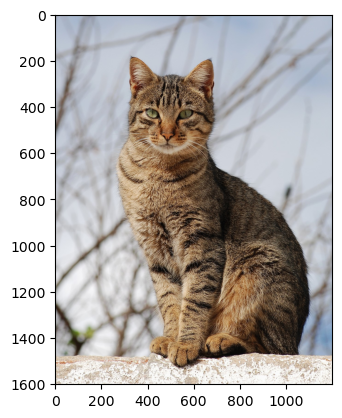

In [11]:
#Kiểm tra opencv đọc ảnh và đặt ảnh cho đúng hiển thị ban đầu
img = cv2.imread('cat.jpg')
img = img[:,:,::-1]
hnat.imshow(img)

1.Thực hành xử lý ảnh trong miền tần số: 

In [12]:
# Fast Fourier Transform (FFT) algorithm để phát hiện ảnh mờ

import numpy as np
import cv2
from matplotlib import pyplot as hnat

# Đọc ảnh màu
img = cv2.imread('cat.jpg')

# Chuyển ảnh màu sang grayscale vì DFT chỉ xử lý ảnh 1 kênh
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Chuyển sang float32 để dùng cho DFT
img_float32 = np.float32(img_gray)

# Thực hiện biến đổi Fourier rời rạc (DFT)
dft = cv2.dft(img_float32, flags=cv2.DFT_COMPLEX_OUTPUT)

# Dịch chuyển tần số thấp về trung tâm ảnh
dft_shift = np.fft.fftshift(dft)

# Tính phổ biên độ và đưa về thang log
magnitude_spectrum = 20*np.log(cv2.magnitude(dft_shift[:,:,0], dft_shift[:,:,1]) + 1)

2.Sử dụng đoạn code sau cho DFT, trình bày ý nghĩa của từng dòng lệnh. 

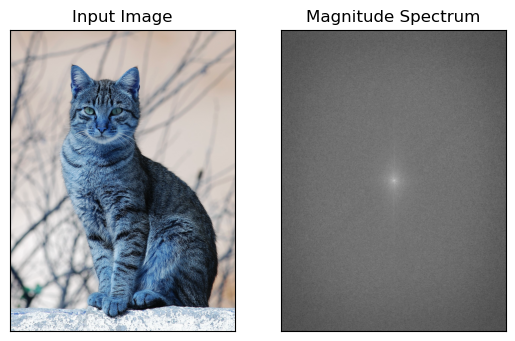

In [ ]:
hnat.subplot(121), hnat.imshow(img, cmap='gray')
# hnat.subplot(121):
# chia cửa sổ hiển thị thành 1 hàng 2 cột
# 1 là vị trí của hình cần vẽ (hình bên trái)

# hnat.imshow(img, cmap='gray'):
# hiển thị ảnh gốc img bằng matplotlib
# cmap='gray' nghĩa là hiển thị ảnh theo thang màu xám (grayscale)


hnat.title('Input Image'), hnat.xticks([]), hnat.yticks([])
# hnat.title('Input Image'):
# đặt tiêu đề cho hình là "Input Image"

# hnat.xticks([]):
# xoá các giá trị trục X để ảnh hiển thị gọn hơn

# hnat.yticks([]):
# xoá các giá trị trục Y


hnat.subplot(122), hnat.imshow(magnitude_spectrum, cmap='gray')
# hnat.subplot(122):
# chia cửa sổ thành 1 hàng 2 cột
# chọn vị trí thứ 2 để hiển thị (hình bên phải)

# hnat.imshow(magnitude_spectrum, cmap='gray'):
# hiển thị phổ biên độ (Magnitude Spectrum) của ảnh sau khi biến đổi Fourier
# phổ này thể hiện các thành phần tần số của ảnh


hnat.title('Magnitude Spectrum'), hnat.xticks([]), hnat.yticks([])
# đặt tiêu đề cho ảnh là "Magnitude Spectrum"
# tiếp tục xoá trục X và Y để ảnh dễ quan sát


hnat.show()
# hiển thị toàn bộ figure gồm:
# - ảnh gốc
# - phổ tần số của ảnh

3.Sử dụng Fast Fourier Transform (FFT) Magnitude algorithm để phát hiện ảnh mờ

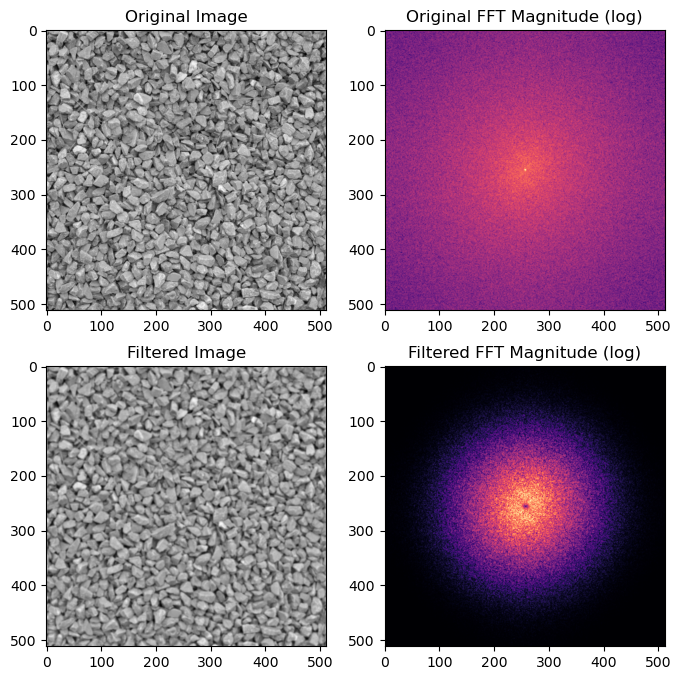

In [13]:
import matplotlib.pyplot as hnat
import numpy as np
from skimage.data import gravel
from skimage.filters import difference_of_gaussians
from skimage.filters import window
from scipy.fft import fftn, fftshift

# Lấy ảnh mẫu "gravel" từ thư viện skimage
image = gravel()

# Tạo cửa sổ Hann có cùng kích thước với ảnh
win = window('hann', image.shape)
# window Hann giúp giảm hiện tượng nhiễu biên (edge effect)
# khi thực hiện FFT trên ảnh

# Nhân ảnh với cửa sổ Hann
wimage = image * win
# áp dụng windowing để làm mượt biên ảnh trước khi FFT

# Lọc ảnh bằng Difference of Gaussians (DoG)
filtered_image = difference_of_gaussians(image, 1, 12)
# bộ lọc DoG giúp làm nổi bật các chi tiết / cạnh trong ảnh

# Áp dụng window Hann cho ảnh đã lọc
filtered_wimage = filtered_image * win

# Thực hiện FFT cho ảnh gốc đã window
im_f_mag = fftshift(np.abs(fftn(wimage)))
# fftn(): biến đổi Fourier nhiều chiều
# np.abs(): lấy biên độ phổ
# fftshift(): đưa tần số thấp về giữa ảnh

# FFT cho ảnh sau khi lọc
fim_f_mag = fftshift(np.abs(fftn(filtered_wimage)))

# Tạo figure gồm 4 hình
fig, ax = hnat.subplots(nrows=2, ncols=2, figsize=(8, 8))

# Hiển thị ảnh gốc
ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original Image')

# Hiển thị phổ tần số của ảnh gốc
ax[0, 1].imshow(np.log(im_f_mag + 1), cmap='magma')
ax[0, 1].set_title('Original FFT Magnitude (log)')
# dùng log để giảm chênh lệch biên độ tần số

# Hiển thị ảnh sau khi lọc DoG
ax[1, 0].imshow(filtered_image, cmap='gray')
ax[1, 0].set_title('Filtered Image')

# Hiển thị phổ FFT của ảnh đã lọc
ax[1, 1].imshow(np.log(fim_f_mag + 1), cmap='magma')
ax[1, 1].set_title('Filtered FFT Magnitude (log)')

# Hiển thị toàn bộ figure
hnat.show()

In [15]:
import cv2
import numpy as np
from IPython.display import Image
def detect_corner(image_path, blockSize=2, ksize=3, k=0.04, threshold=0.01):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    dst = cv2.cornerHarris(gray, blockSize, ksize, k)
    #result is dilated for marking the corners, not important
    dst = cv2.dilate(dst, None)
    # Threshold for an optimal value, it may vary depending on the image.
    img[dst>threshold*dst.max()]=[0, 0, 255]
    cv2.imwrite('example.jpg',img)
    return img
out_path = detect_corner('cat.jpg', blockSize=2, ksize=5, k=0.04, threshold=0.005)
Image(out_path)

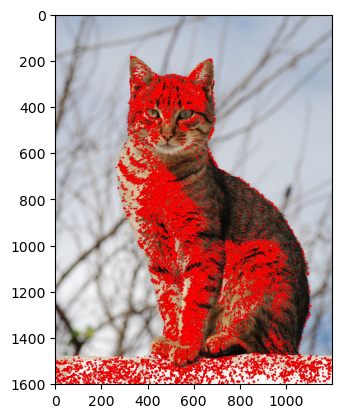

In [16]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

img = cv2.imread('example.jpg')
plt.imshow(img[:,:,::-1])

gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray,2,3,0.04)
dst = cv2.dilate(dst,None)
img[dst>0.01*dst.max()] = [0,0,225]
plt.imshow(img[:,:,::-1])

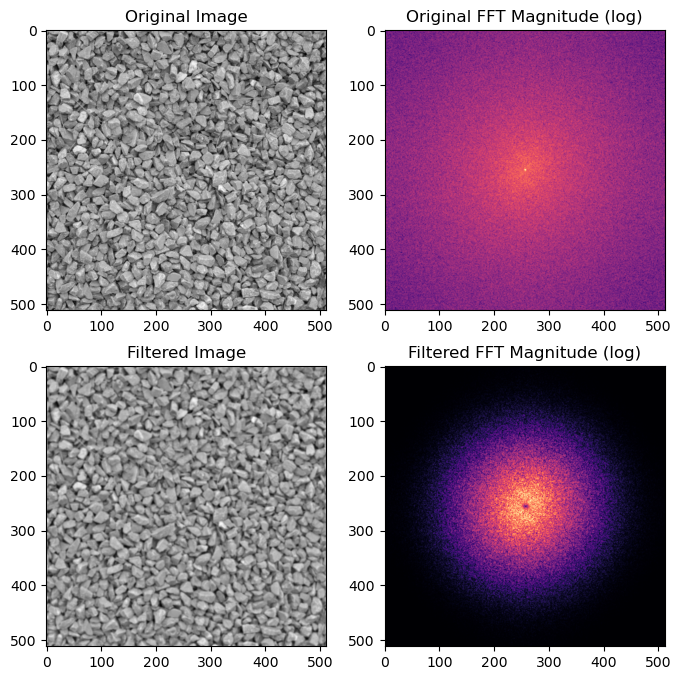

In [18]:
# Band-pass filtering by Difference of Gaussians

import matplotlib.pyplot as plt
import numpy as np
from skimage.data import gravel
from skimage.filters import difference_of_gaussians, window
from scipy.fft import fftn, fftshift

# Lấy ảnh mẫu gravel từ thư viện skimage
image = gravel()

# Tạo cửa sổ Hann có cùng kích thước với ảnh
win = window('hann', image.shape)
# window Hann giúp giảm nhiễu biên khi thực hiện FFT

# Nhân ảnh với cửa sổ Hann
wimage = image * win
# bước này giúp FFT hiển thị phổ tần số rõ hơn

# Lọc ảnh bằng Difference of Gaussians
filtered_image = difference_of_gaussians(image, 1, 12)
# DoG giúp làm nổi bật các chi tiết và cạnh của ảnh

# Áp dụng window Hann cho ảnh đã lọc
filtered_wimage = filtered_image * win

# Thực hiện FFT cho ảnh gốc
im_f_mag = fftshift(np.abs(fftn(wimage)))
# fftn() : biến đổi Fourier
# abs() : lấy biên độ
# fftshift() : đưa tần số thấp về trung tâm

# FFT cho ảnh đã lọc
fim_f_mag = fftshift(np.abs(fftn(filtered_wimage)))

# Tạo figure hiển thị 4 ảnh
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(8,8))

# Hiển thị ảnh gốc
ax[0,0].imshow(image, cmap='gray')
ax[0,0].set_title('Original Image')

# Hiển thị phổ FFT của ảnh gốc
ax[0,1].imshow(np.log(im_f_mag + 1), cmap='magma')
ax[0,1].set_title('Original FFT Magnitude (log)')

# Hiển thị ảnh sau khi lọc
ax[1,0].imshow(filtered_image, cmap='gray')
ax[1,0].set_title('Filtered Image')

# Hiển thị phổ FFT của ảnh sau lọc
ax[1,1].imshow(np.log(fim_f_mag + 1), cmap='magma')
ax[1,1].set_title('Filtered FFT Magnitude (log)')

plt.show()